<a href="https://colab.research.google.com/github/AdityaGogoi/Fast-AI-Deep-Learning/blob/master/Lesson3_Unet_Classification_with_Camvid_tiramisu_dataset.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

## Image segmentation with CamVid

In [0]:
!curl -s https://course.fast.ai/setup/colab | bash

Updating fastai...
Done.


In [0]:
%reload_ext autoreload
%autoreload 2
%matplotlib inline

In [0]:
from fastai import *
from fastai.vision import *
from fastai.callbacks.hooks import *

The One Hundred Layer Tiramisu paper used a modified version of Camvid, with smaller images and few classes. You can get it from the CamVid directory of this repo:

    git clone https://github.com/alexgkendall/SegNet-Tutorial.git

In [0]:
! git clone https://github.com/alexgkendall/SegNet-Tutorial.git

Cloning into 'SegNet-Tutorial'...
remote: Enumerating objects: 2785, done.
remote: Total 2785 (delta 0), reused 0 (delta 0), pack-reused 2785
Receiving objects: 100% (2785/2785), 340.84 MiB | 14.21 MiB/s, done.
Resolving deltas: 100% (81/81), done.


In [0]:
! ls -lrt ./SegNet-Tutorial/CamVid

total 132
-rw-r--r-- 1 root root 19215 Jul 27 15:19 test.txt
drwxr-xr-x 2 root root 12288 Jul 27 15:19 test
drwxr-xr-x 2 root root 12288 Jul 27 15:19 testannot
-rw-r--r-- 1 root root 30053 Jul 27 15:19 train.txt
drwxr-xr-x 2 root root 20480 Jul 27 15:19 train
-rw-r--r-- 1 root root  7777 Jul 27 15:19 val.txt
drwxr-xr-x 2 root root 20480 Jul 27 15:19 trainannot
drwxr-xr-x 2 root root  4096 Jul 27 15:19 val
drwxr-xr-x 2 root root  4096 Jul 27 15:19 valannot


In [0]:
path = Path('./SegNet-Tutorial/CamVid')

In [0]:
path.ls()

[PosixPath('SegNet-Tutorial/CamVid/val'),
 PosixPath('SegNet-Tutorial/CamVid/test.txt'),
 PosixPath('SegNet-Tutorial/CamVid/testannot'),
 PosixPath('SegNet-Tutorial/CamVid/train.txt'),
 PosixPath('SegNet-Tutorial/CamVid/val.txt'),
 PosixPath('SegNet-Tutorial/CamVid/trainannot'),
 PosixPath('SegNet-Tutorial/CamVid/valannot'),
 PosixPath('SegNet-Tutorial/CamVid/train'),
 PosixPath('SegNet-Tutorial/CamVid/test')]

## Data

In [0]:
fnames = get_image_files(path/'val')
fnames[:3]

[PosixPath('SegNet-Tutorial/CamVid/val/0016E5_07989.png'),
 PosixPath('SegNet-Tutorial/CamVid/val/0016E5_08119.png'),
 PosixPath('SegNet-Tutorial/CamVid/val/0016E5_08159.png')]

In [0]:
lbl_names = get_image_files(path/'valannot')
lbl_names[:3]

[PosixPath('SegNet-Tutorial/CamVid/valannot/0016E5_07989.png'),
 PosixPath('SegNet-Tutorial/CamVid/valannot/0016E5_08119.png'),
 PosixPath('SegNet-Tutorial/CamVid/valannot/0016E5_08159.png')]

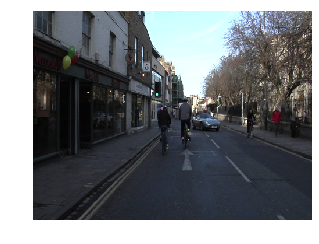

In [0]:
img_f = fnames[0]
img = open_image(img_f)
img.show(figsize=(5,5))

In [0]:
def get_y_fn(x): return Path(str(x.parent)+'annot')/x.name

codes = array(['Sky', 'Building', 'Pole', 'Road', 'Sidewalk', 'Tree',
    'Sign', 'Fence', 'Car', 'Pedestrian', 'Cyclist', 'Void'])

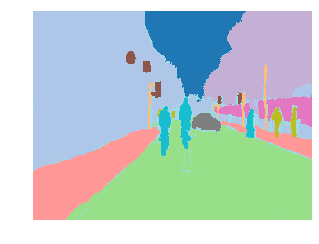

In [0]:
mask = open_mask(get_y_fn(img_f))
mask.show(figsize=(5,5), alpha=1)

In [0]:
src_size = np.array(mask.shape[1:])
src_size,mask.data

(array([360, 480]), tensor([[[1, 1, 1,  ..., 5, 5, 5],
          [1, 1, 1,  ..., 5, 5, 5],
          [1, 1, 1,  ..., 5, 5, 5],
          ...,
          [4, 4, 4,  ..., 3, 3, 3],
          [4, 4, 4,  ..., 3, 3, 3],
          [4, 4, 4,  ..., 3, 3, 3]]]))

## Datasets

In [0]:
bs,size = 8,src_size//2

In [0]:
src = (SegmentationItemList.from_folder(path)
       .split_by_folder(valid='val')
       .label_from_func(get_y_fn, classes=codes))

In [0]:
data = (src.transform(get_transforms(), tfm_y=True)
        .databunch(bs=bs)
        .normalize(imagenet_stats))

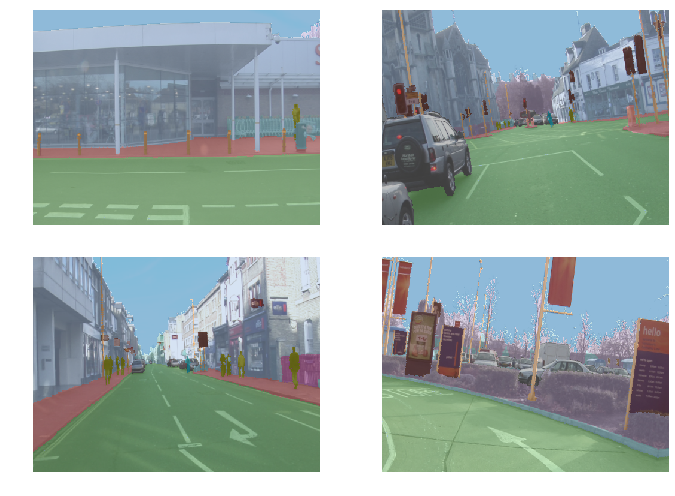

In [0]:
data.show_batch(2, figsize=(10,7))

## Model

In [0]:
name2id = {v:k for k,v in enumerate(codes)}
void_code = name2id['Void']

def acc_camvid(input, target):
    target = target.squeeze(1)
    mask = target != void_code
    return (input.argmax(dim=1)[mask]==target[mask]).float().mean()

In [0]:
metrics=acc_camvid
wd=1e-2

In [0]:
learn = unet_learner(data, models.resnet34, metrics=metrics, wd=wd, bottle=True)

LR Finder is complete, type {learner_name}.recorder.plot() to see the graph.


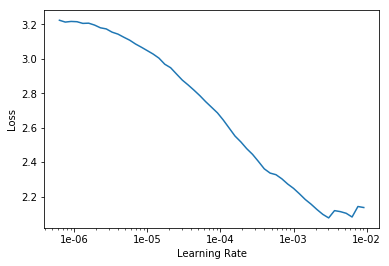

In [0]:
lr_find(learn)
learn.recorder.plot()

In [0]:
lr=2e-3

In [0]:
learn.fit_one_cycle(10, slice(lr), pct_start=0.8)

epoch,train_loss,valid_loss,acc_camvid,time
0,1.117472,0.812364,0.762949,01:55
1,0.775285,0.697261,0.812248,01:45
2,0.621671,0.466293,0.866831,01:44
3,0.549393,0.505221,0.854289,01:45
4,0.529121,0.425284,0.877391,01:44
5,0.466104,0.353381,0.886889,01:44
6,1.522606,1.778074,0.411082,01:44
7,1.863359,6.673815,0.408927,01:44
8,1.466516,0.981520,0.750641,01:44
9,1.035881,0.734909,0.786818,01:44


In [0]:
learn.save('stage-1')

In [0]:
learn.load('stage-1');

In [0]:
learn.unfreeze()

In [0]:
lrs = slice(lr/100,lr)

In [0]:
learn.fit_one_cycle(12, lrs, pct_start=0.8)

epoch,train_loss,valid_loss,acc_camvid,time
0,0.671785,0.667922,0.784390,01:49
1,0.624645,0.566363,0.850846,01:48
2,0.526954,0.449380,0.867933,01:48
3,0.453965,0.388490,0.878463,01:48
4,0.420513,0.347674,0.899311,01:48
5,0.393836,0.319479,0.897154,01:48
6,0.370366,0.360644,0.892295,01:48
7,0.359627,0.351364,0.890122,01:48
8,0.342591,0.305810,0.914971,01:48
9,0.342266,0.287821,0.905610,01:48


In [0]:
learn.save('stage-2');

## Go big

In [0]:
learn=None
gc.collect()

42

You may have to restart your kernel and come back to this stage if you run out of memory, and may also need to decrease `bs`.

In [0]:
size = src_size
bs=8

In [0]:
data = (src.transform(get_transforms(), size=size, tfm_y=True)
        .databunch(bs=bs)
        .normalize(imagenet_stats))

In [0]:
learn = unet_learner(data, models.resnet34, metrics=metrics, wd=wd, bottle=True).load('stage-2');

LR Finder is complete, type {learner_name}.recorder.plot() to see the graph.


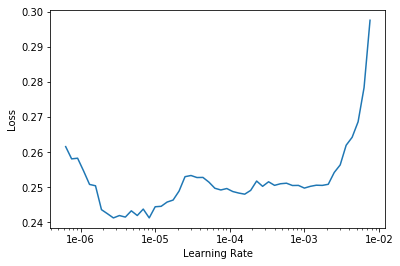

In [0]:
lr_find(learn)
learn.recorder.plot()

In [0]:
lr=1e-3

In [0]:
learn.fit_one_cycle(10, slice(lr), pct_start=0.8)

epoch,train_loss,valid_loss,acc_camvid,time
0,0.247336,0.272712,0.915158,01:43
1,0.242933,0.266659,0.918848,01:44
2,0.238133,0.255139,0.921206,01:43
3,0.239176,0.255685,0.925457,01:44
4,0.236806,0.290858,0.916651,01:44
5,0.239033,0.263344,0.916158,01:44
6,0.234350,0.261457,0.923163,01:44
7,0.230232,0.259401,0.922756,01:44
8,0.224319,0.306761,0.914140,01:44
9,0.208343,0.249241,0.929621,01:44


In [0]:
learn.save('stage-1-big')

In [0]:
learn.load('stage-1-big');

In [0]:
learn.unfreeze()

In [0]:
lrs = slice(lr/1000,lr/10)

In [0]:
learn.fit_one_cycle(10, lrs)

epoch,train_loss,valid_loss,acc_camvid,time
0,0.194564,0.253165,0.928486,01:49
1,0.189170,0.252306,0.928930,01:49
2,0.189308,0.250012,0.929322,01:48
3,0.187594,0.253872,0.928651,01:48
4,0.186363,0.248091,0.930153,01:49
5,0.184727,0.250982,0.929611,01:48
6,0.181625,0.246172,0.931534,01:48
7,0.179815,0.250980,0.929491,01:48
8,0.179779,0.248191,0.930778,01:48
9,0.179613,0.248276,0.930261,01:48


In [0]:
learn.save('stage-2-big')

In [0]:
learn.load('stage-2-big');

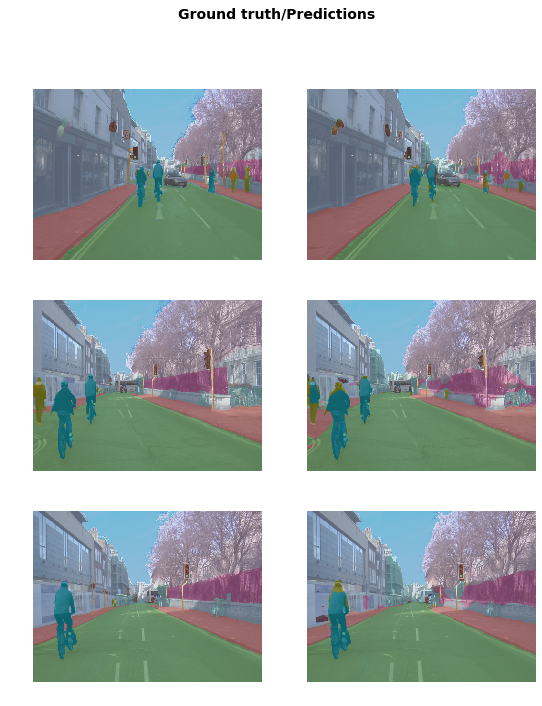

In [0]:
learn.show_results(rows=3, figsize=(9,11))

## fin

In [0]:
# start: 480x360

In [0]:
print(learn.summary())

DynamicUnet
Layer (type)         Output Shape         Param #    Trainable 
Conv2d               [64, 180, 240]       9,408      True      
______________________________________________________________________
BatchNorm2d          [64, 180, 240]       128        True      
______________________________________________________________________
ReLU                 [64, 180, 240]       0          False     
______________________________________________________________________
MaxPool2d            [64, 90, 120]        0          False     
______________________________________________________________________
Conv2d               [64, 90, 120]        36,864     True      
______________________________________________________________________
BatchNorm2d          [64, 90, 120]        128        True      
______________________________________________________________________
ReLU                 [64, 90, 120]        0          False     
__________________________________________________

## Classifying random Street Images using UNET Learner

As in the **CamVid Notebook**, I will use the **same street images** and try to get different **elements** within the image **classified** by the Model.

At the **end** I will provide a **comparative analysis** between the **Default CamVid dataset** and the **CamVid-Tiramisu dataset** quality and how much of a **difference** did they cause in the **final result**.

In [0]:
from google.colab import drive
drive.mount('/content/gdrive', force_remount=True)
root_dir = "/content/gdrive/My Drive/"
base_dir = root_dir + 'fastai-v3/'

Mounted at /content/gdrive


In [0]:
path = Path(base_dir + 'data/StreetImages')

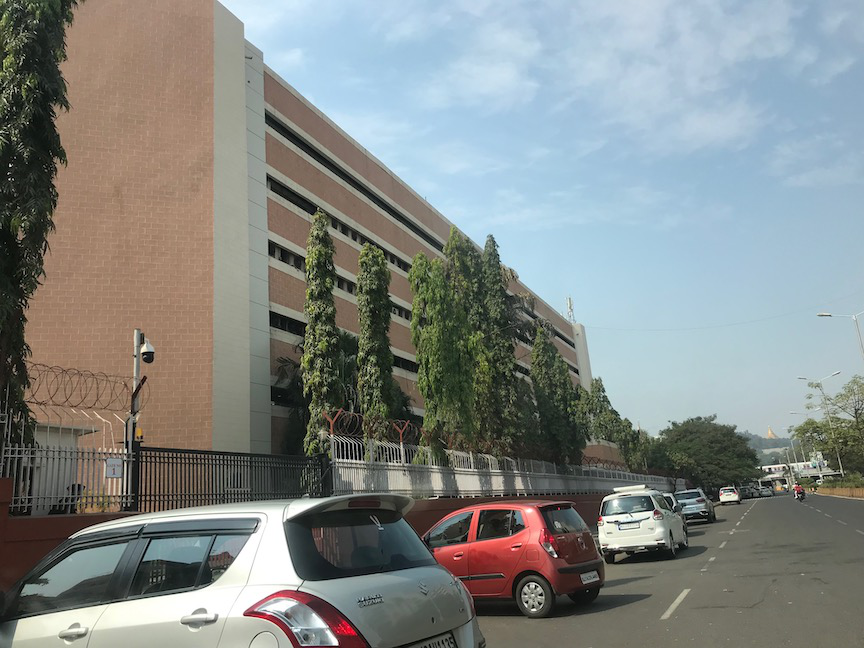

In [0]:
img = open_image(path/'india-1.JPG')
img

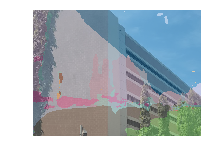

In [0]:
img.show(y=learn.predict(img)[0])

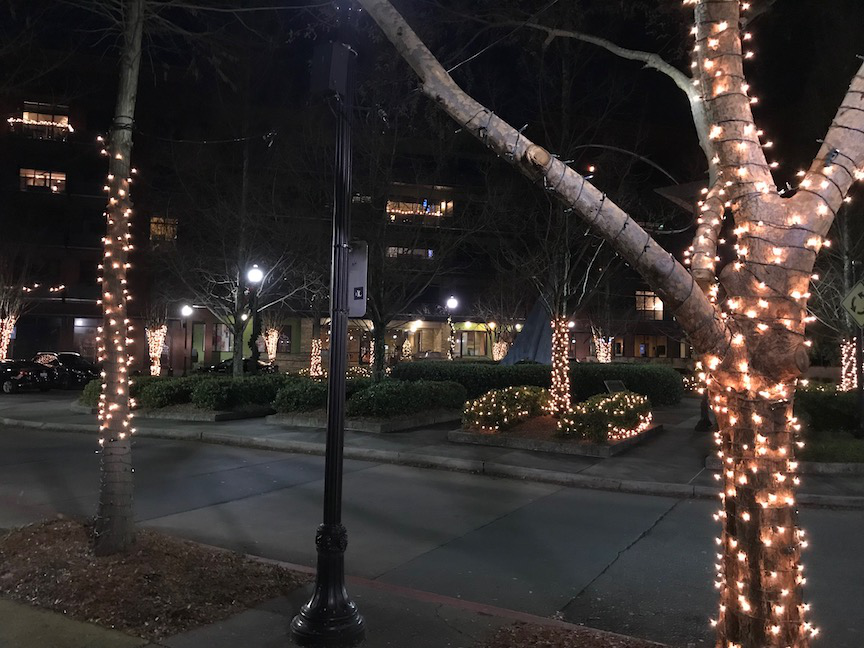

In [0]:
img = open_image(path/'atlanta-4.JPG')
img

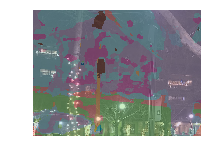

In [0]:
img.show(y=learn.predict(img)[0])

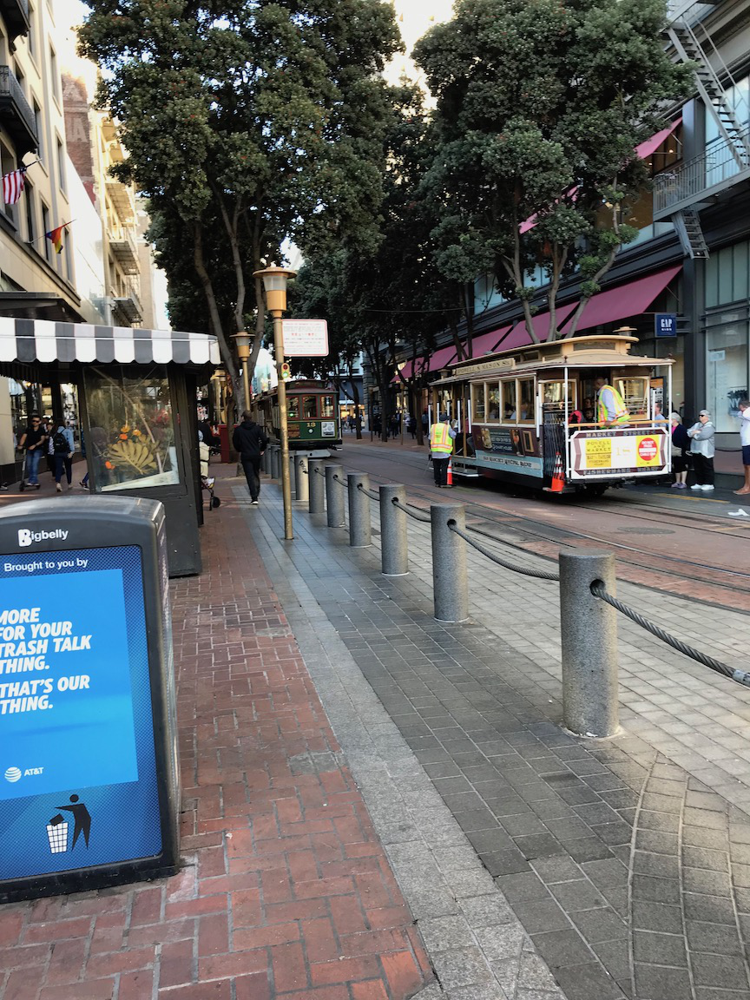

In [0]:
img = open_image(path/'sanFrancisco-2.JPG')
img

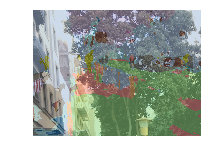

In [0]:
img.show(y=learn.predict(img)[0])

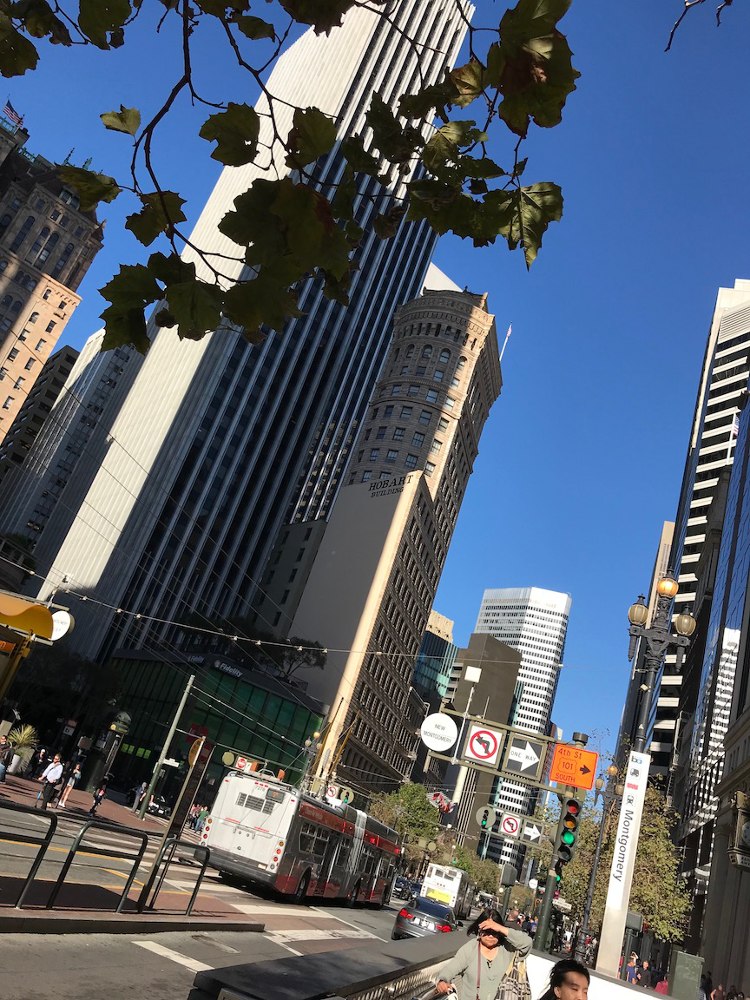

In [0]:
img = open_image(path/'sanFrancisco-1.JPG')
img

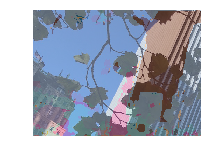

In [0]:
img.show(y=learn.predict(img)[0])

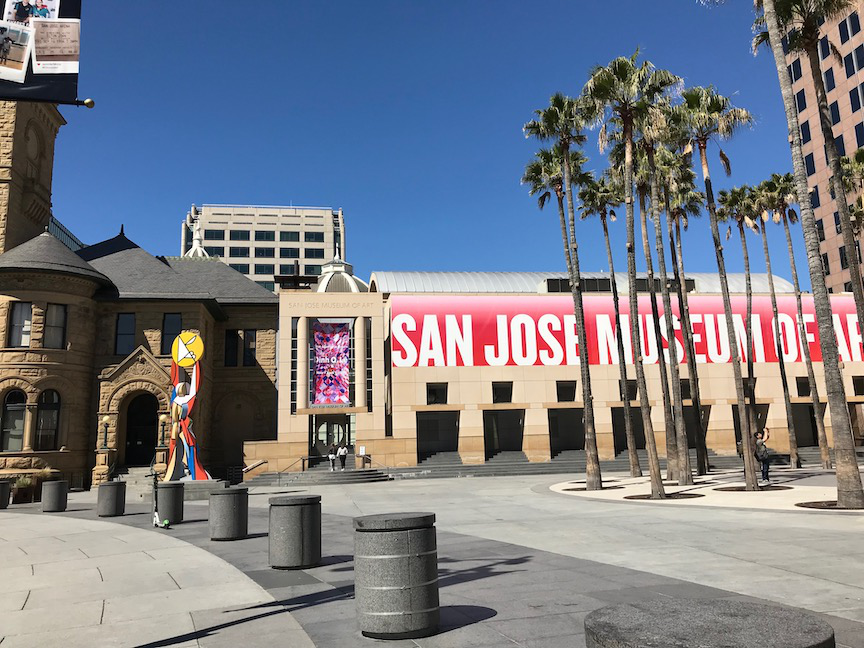

In [0]:
img = open_image(path/'sanJose-1.JPG')
img

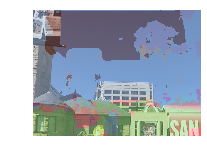

In [0]:
img.show(y=learn.predict(img)[0])

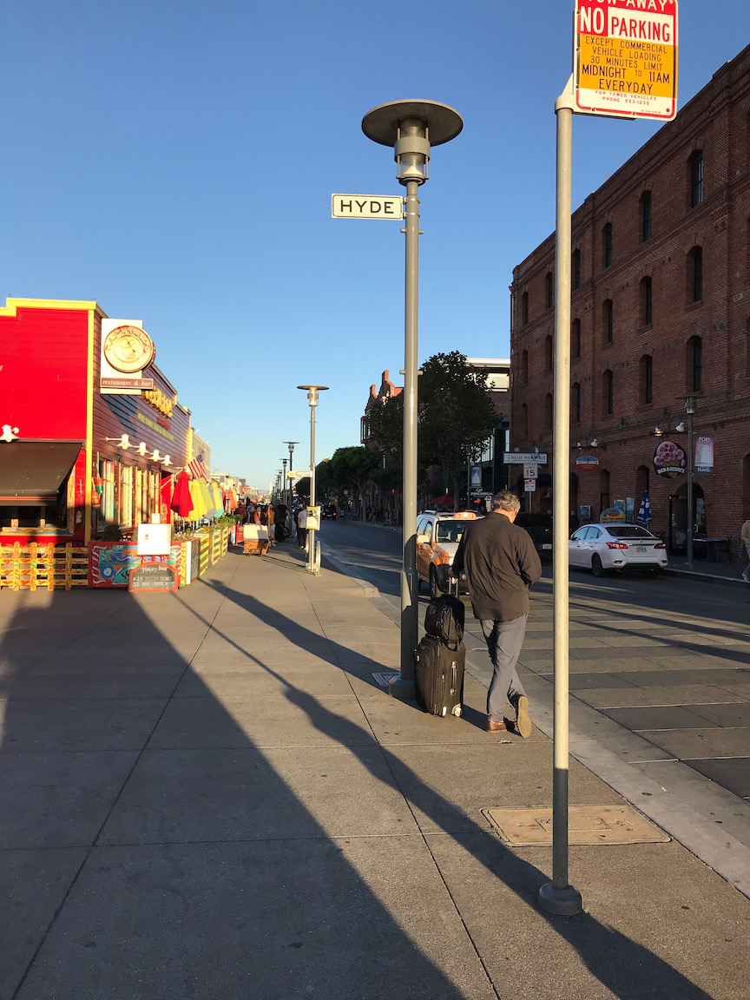

In [0]:
img = open_image(path/'sanFrancisco-4.JPG')
img

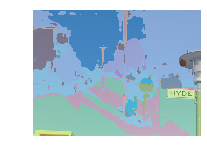

In [0]:
img.show(y=learn.predict(img)[0])

## Conclusions

The **differences** between the **original CamVid** and the **new Tiramisu** dataset are:

1. The **improvement** in **grouping** and **classification** of **pixels** in the training dataset has **in general improved** the **results** of the model on the **validation images**.

2. But I still believe that the fact that we **cannot extend** this **labelling technique** on **other images** makes it **difficult** to **train** on a more **diverse** set of images.